Clean up and test code

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import time
import math

In [ ]:
from google.colab import files

data_upload = files.upload()

for file_name in data_upload.keys():
  print(f"{file_name} has been uploaded, with length {len(data_upload[file_name])}")

In [ ]:
from neuron_layer import NeuronLayerX
from neuron_network import NeuronNetwork
from functions_sim import *

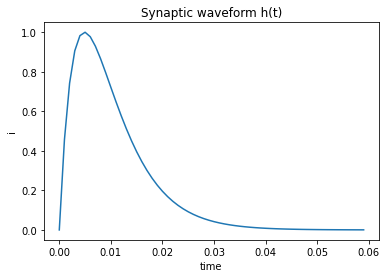

In [ ]:
dt = 1e-3
tau1 = 6e-3 # in ms
tau2 = 4e-3
duration = 10*max(tau1, tau2) # 10 times the longest time constant
t = np.arange(0, duration, dt)
synaptic_waveform = np.exp(-t/tau1)-np.exp(-t/tau2)
synaptic_waveform = synaptic_waveform/np.amax(synaptic_waveform)
plt.plot(t, synaptic_waveform)
plt.xlabel("time")
plt.ylabel("i")
plt.title("Synaptic waveform h(t)")
plt.show()

In [ ]:
net = NeuronLayerX('net',3,synaptic_waveform)

In [ ]:
net.vth

array([[1.],
       [1.],
       [1.]])

In [ ]:
i_ext = 1.5
N = 1000

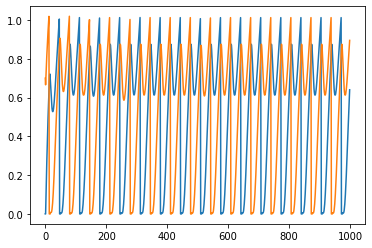

In [ ]:
i_ext = 1.5
N = 1000
w_cross = -1.5
w_self = -1.5
outputs = run_simulation(w_cross, w_self, i_ext, synaptic_waveform,N, v_initial=np.array([0, 0.7]).reshape((2,1)))
v, s = outputs["voltage"], outputs["spike"]
plt.plot(v[:,0])
plt.plot(v[:,1])

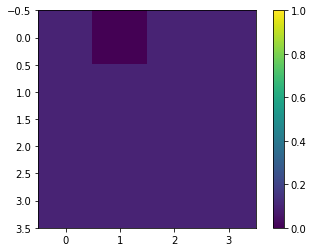

In [ ]:
a = 0.1*np.ones((4,4))
a[0,1]=0
plt.imshow(a, vmin=0, vmax=1)
plt.colorbar()

In [ ]:
w_all=[0, -0.1, -0.3, -0.5, -1, -2]

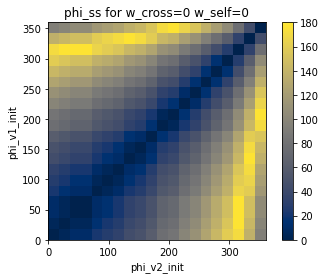

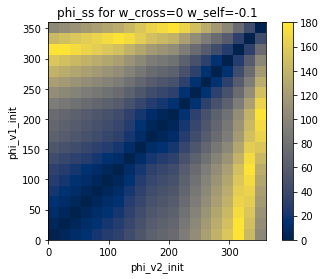

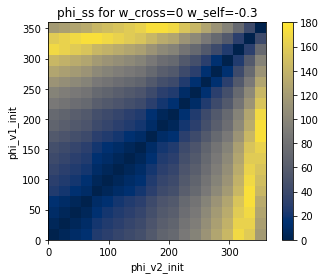

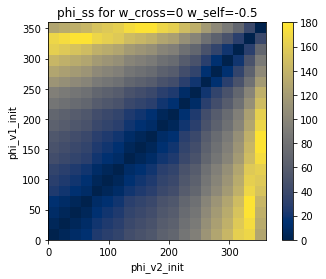

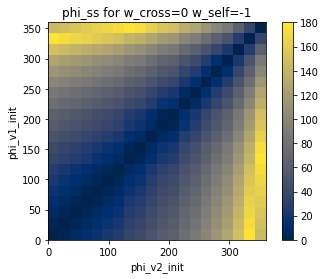

...

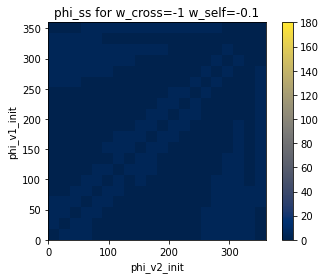

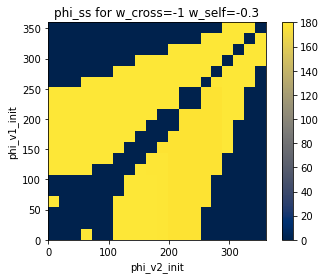

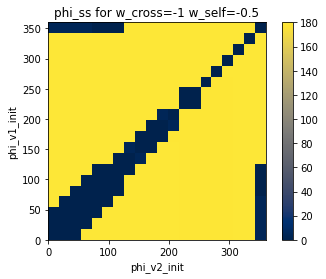

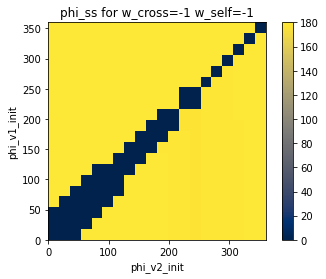

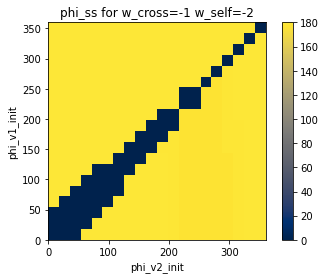

/content/functions_sim.py:59: UserWarning: Time period of oscillation of 1,2 differs by more than 2ms
  warnings.warn("Time period of oscillation of 1,2 differs by more than 2ms")


IndexError: ignored

In [ ]:
for i in range(len(w_all)):
  for j in range(len(w_all)):
    n_v = 20
    v_values = np.linspace(0, 1, n_v)
    w_cross = w_all[i]
    w_self = w_all[j]
    i_ext_mag = 1.05
    plt_ttl = "phi_ss for w_cross="+ str(w_cross) +" w_self="+ str(w_self)
    phi_all = v_init_sweep(v_values, w_cross, w_self, i_ext_mag, synaptic_waveform)
    plot_phase(phi_all, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)


In [ ]:
def v_init_sweep2(v_values, w_cr, w_se, iext, syn_wav):
    n_neurons=2
    n_steps = 2000
    n_v = len(v_values)
    # v_values = np.linspace(0, 0.5, n_v)
    phi_all = np.zeros((n_v, n_v))
    for m in range(n_v):
        for k in range(n_v):
            v_init = np.array([v_values[m], v_values[k]]).reshape((2,1))
            outputs = run_simulation(w_cross=w_cr, w_self=w_se, i_ext_mag=iext,synaptic_waveform=syn_wav, num_steps=n_steps, num_neurons=n_neurons, v_initial=v_init)
            v,s = outputs['voltage'], outputs['spike']
            phi = settling_phase(s[:,0], s[:,1])
            phi_all[m,k] = phi
    return phi_all


In [ ]:
# for i in range(len(w_all)):
#   for j in range(len(w_all)):
#     n_v = 20
#     v_values = np.linspace(0, 1, n_v)
#     w_cross = w_all[i]
#     w_self = w_all[j]
#     i_ext_mag = 1.5
#     if w_cross ==-1.5 or w_cross==-2:
#       plt_ttl = "phi_ss for w_cross="+ str(w_cross) +" w_self="+ str(w_self)
#       phi_all = v_init_sweep2(v_values, w_cross, w_self, i_ext_mag, synaptic_waveform)
#       plot_phase(phi_all, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)


Compute phase as a function of time in the following way:
1. Phase of neuron i at time t is proportional to t (within time period)



```
at each time instant t:
  for each neuron:
    phi_neuron = (t-t_spk)/(t_{spk+1}-t_spk)
```
2. Phase difference =phi_1(t)-phi_2(t)





In [ ]:
def get_phase_t(spikes_1, spikes_2):
    """
    spikes_1, spikes_2 are binary arrays of length=num_timesteps
    They contain 1 when the corresponding neuron issued a spike
    """
    assert spikes_1.shape==spikes_2.shape
    n_timesteps = len(spikes_1)
    phi1 = np.zeros(spikes_1.shape)
    phi2 = np.zeros(spikes_2.shape)

    for t in range(n_timesteps): 
        t_spk_most_recent1 = [np.amax(np.argwhere(spikes_1[:t])) if len(np.argwhere(spikes_1[:t])) is not 0 else 0]
        # print(f"most recent spike time={t_spk_most_recent1}")
        t_spk_just_after1 = [np.amin(np.argwhere(spikes_1[t:])+t) if len(np.argwhere(spikes_1[t:])) is not 0 else t_spk_most_recent1[0]+T1] 
        #after the last spike, the period of oscillation is taken to equal previous period T    
        # print(f"spike time just after={t_spk_just_after1}")
        T1 = t_spk_just_after1[0]-t_spk_most_recent1[0]
        phi1[t] = (360*(t-t_spk_most_recent1[0])/T1)%360
        # print(f"Time period:{T}")
        # print(f"Phase:{phi1[t]}")

        t_spk_most_recent2 = [np.amax(np.argwhere(spikes_2[:t])) if len(np.argwhere(spikes_2[:t])) is not 0 else 0]
        # print(f"most recent spike time={t_spk_most_recent2}")
        t_spk_just_after2 = [np.amin(np.argwhere(spikes_2[t:])+t) if len(np.argwhere(spikes_2[t:])) is not 0 else t_spk_most_recent2[0]+T2] 
        #after the last spike, the period of oscillation is taken to equal previous period T    
        # print(f"spike time just after={t_spk_just_after2}")
        T2 = t_spk_just_after2[0]-t_spk_most_recent2[0]
        phi2[t] = (360*(t-t_spk_most_recent2[0])/T2)%360
        # print(f"Time period:{T2}")
        # print(f"Phase:{phi2[t]}")

    # plt.plot((phi1-phi2)%360)
    delphi = (phi1-phi2)%360

    return delphi,phi1, phi2  


In [ ]:
phi,a,b=get_phase_t(s[:,0], s[:,1])

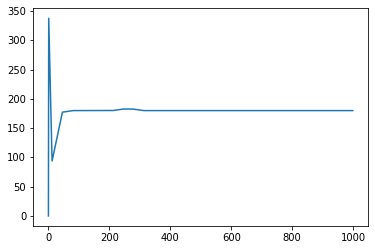

In [ ]:
plt.plot(phi)

In [ ]:
s.shape

(1000, 2)

In [ ]:
spike1 = s[:,0]

In [ ]:
spike1.shape

(1000,)

In [ ]:
np.argwhere(spike1)

array([[ 46],
       [112],
       [178],
       [244],
       [311],
       [377],
       [443],
       [509],
       [575],
       [641],
       [707],
       [773],
       [839],
       [905],
       [971]])

In [ ]:
phi1 = np.zeros(spike1.shape)

In [ ]:
phi1.shape

(1000,)

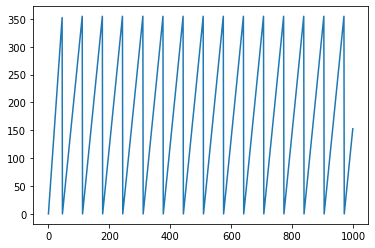

In [ ]:
for t in range(len(phi1)): 
    t_spk_most_recent = [np.amax(np.argwhere(spike1[:t])) if len(np.argwhere(spike1[:t])) is not 0 else 0]
    # print(f"most recent spike time={t_spk_most_recent}")
    t_spk_just_after = [np.amin(np.argwhere(spike1[t:])+t) if len(np.argwhere(spike1[t:])) is not 0 else t_spk_most_recent[0]+T] 
    #after the last spike, the period of oscillation is taken to equal previous period T    
    # print(f"spike time just after={t_spk_just_after}")
    T = t_spk_just_after[0]-t_spk_most_recent[0]
    phi1[t] = (360*(t-t_spk_most_recent[0])/T)%360
    # print(f"Time period:{T}")
    # print(f"Phase:{phi1[t]}")

plt.plot(phi1)

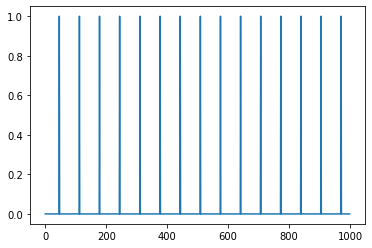

In [ ]:
plt.plot(spike1)

In [ ]:
len(np.argwhere(spike1[:0]))

0

In [ ]:
np.amax(np.argwhere(spike1[:200]))

178

In [ ]:
np.amin(np.argwhere(spike1[:200]))

46

In [ ]:
np.argwhere(spike1)

array([[ 46],
       [112],
       [178],
       [244],
       [311],
       [377],
       [443],
       [509],
       [575],
       [641],
       [707],
       [773],
       [839],
       [905],
       [971]])

In [ ]:
np.argwhere(spike1[47:])+47

array([[112],
       [178],
       [244],
       [311],
       [377],
       [443],
       [509],
       [575],
       [641],
       [707],
       [773],
       [839],
       [905],
       [971]])

In [ ]:
np.amin(np.argwhere(spike1[47:])+47)

112

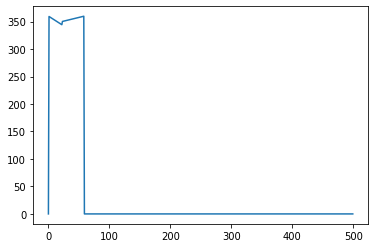

In [ ]:
i_ext = 1.5
N = 500
w_cross = -0.5
w_self = -0.5
outputs = run_simulation(w_cross, w_self, i_ext, synaptic_waveform,N, v_initial=np.array([0, 0.1]).reshape((2,1)))
vmem, spikes = outputs["voltage"], outputs["spike"]
phix, p1x, p2x = get_phase_t(spikes[:,0], spikes[:,1])

plt.plot(phix)

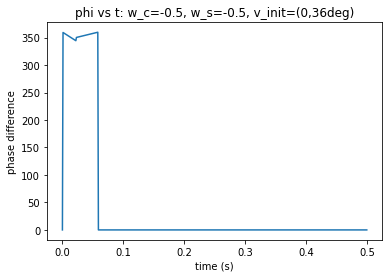

In [ ]:
plt.plot([1e-3*t for t in range(N)],phix)
plt.xlabel("time (s)")
plt.ylabel("phase difference")
plt.title("phi vs t: w_c=-0.5, w_s=-0.5, v_init=(0,36deg)")
plt.show()

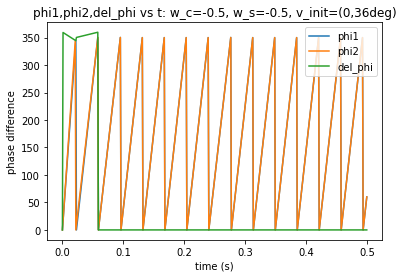

In [ ]:
plt.plot([1e-3*t for t in range(N)],p1x)
plt.plot([1e-3*t for t in range(N)],p2x)
plt.plot([1e-3*t for t in range(N)],phix)
plt.xlabel("time (s)")
plt.ylabel("phase difference")
plt.title("phi1,phi2,del_phi vs t: w_c=-0.5, w_s=-0.5, v_init=(0,36deg)")
plt.legend(["phi1","phi2","del_phi"])
plt.show()

In [ ]:
plt.plot([1e-3*t for t in range(N)],p1)
plt.plot([1e-3*t for t in range(N)],p2)
plt.plot([1e-3*t for t in range(N)],phi)
plt.xlabel("time (s)")
plt.ylabel("phase difference")
plt.title("phi_1,phi_2, del_phi vs t: w_c=-0.5, w_s=-0.5, v_init=(0,100deg)")
plt.legend(["phi1","phi2","del_phi"])
plt.show()

NameError: ignored

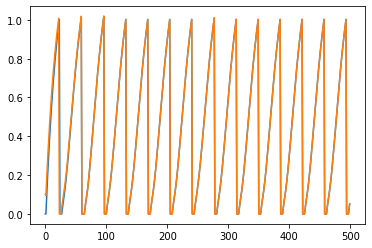

In [ ]:
plt.plot(vmem[:,0])
plt.plot(vmem[:,1])

In [ ]:
phi_ss = phi[-1]

In [ ]:
phi_ss

179.99999999999997

In [ ]:
np.abs(phi-phi_ss)<10

array([False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [ ]:
np.argwhere(np.abs(phi-phi_ss)<10)

array([[  8],
       [ 44],
       [ 45],
       [ 46],
       [ 47],
       [ 48],
       [ 49],
       [ 50],
       [ 51],
       [ 52],
       [ 53],
       [ 54],
       [ 55],
       [ 56],
       [ 57],
       [ 58],
       [ 59],
       [ 60],
       [ 61],
       [ 62],
       [ 63],
       [ 64],
       [ 65],
       [ 66],
       [ 67],
       [ 68],
       [ 69],
       [ 70],
       [ 71],
       [ 72],
       [ 73],
       [ 74],
       [ 75],
       [ 76],
       [ 77],
       [ 78],
       [ 79],
       [ 80],
       [ 81],
       [ 82],
       [ 83],
       [ 84],
       [ 85],
       [ 86],
       [ 87],
       [ 88],
       [ 89],
       [ 90],
       [ 91],
       [ 92],
       [ 93],
       [ 94],
       [ 95],
       [ 96],
       [ 97],
       [ 98],
       [ 99],
       [100],
       [101],
       [102],
       [103],
       [104],
       [105],
       [106],
       [107],
       [108],
       [109],
       [110],
       [111],
       [112],
       [113],
      

In [ ]:
np.amin(np.argwhere(np.abs(phi-phi_ss)<0.05*phi_ss))

8

In [ ]:
phi[-5:]

array([180., 180., 180., 180., 180.])

In [ ]:
np.sum(phi[-5:])/5

180.0

In [ ]:
def get_settling_time(phi_t):
    """
    gives output in ms (gives number of timesteps, each timestep is = 1ms )
    """
    phi_last = phi_t[-5:]
    phi_ss = np.sum(phi_last)/len(phi_last)

    ss_times = np.argwhere(np.abs(phi_t-phi_ss)<0.05*phi_ss) # within 5% of steady state value
    t_s = np.amin(ss_times)
    return t_s

In [ ]:
ts = get_settling_time(phi)

In [ ]:
ts

8

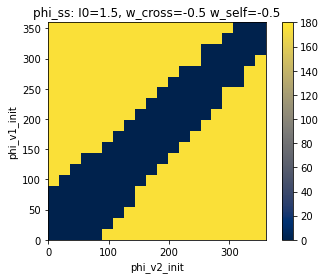

In [ ]:
n_v = 20
v_values = np.linspace(0, 1, n_v)
w_cross = -0.5
w_self = -0.5
i_ext_mag = 1.5
plt_ttl = "phi_ss: I0="+str(i_ext_mag)+ ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
phi_all = v_init_sweep(v_values, w_cross, w_self, i_ext_mag, synaptic_waveform)
plot_phase(phi_all, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

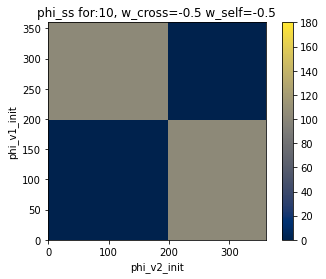

In [ ]:
i_ext_mag2 = 10
n_v = 20
v_values = np.linspace(0, 1, n_v)
w_cross = -0.5
w_self = -0.5
plt_ttl = "phi_ss for:"+str(i_ext_mag2) + ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
phi_all2 = v_init_sweep(v_values, w_cross, w_self, i_ext_mag2, synaptic_waveform)
plot_phase(phi_all2, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

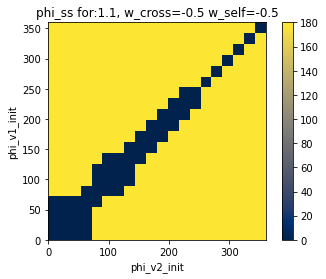

In [ ]:
i_ext_mag2 = 1.1
n_v = 20
v_values = np.linspace(0, 1, n_v)
w_cross = -0.5
w_self = -0.5
plt_ttl = "phi_ss for:"+str(i_ext_mag2) + ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
phi_all2 = v_init_sweep(v_values, w_cross, w_self, i_ext_mag2, synaptic_waveform)
plot_phase(phi_all2, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

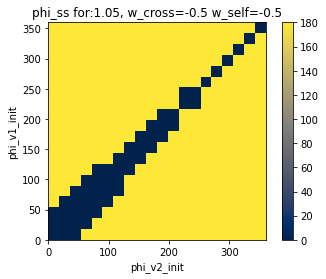

In [ ]:
i_ext_mag2 = 1.05
n_v = 20
v_values = np.linspace(0, 1, n_v)
w_cross = -0.5
w_self = -0.5
plt_ttl = "phi_ss for:"+str(i_ext_mag2) + ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
phi_all2 = v_init_sweep(v_values, w_cross, w_self, i_ext_mag2, synaptic_waveform)
plot_phase(phi_all2, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

In [ ]:
# for iext in [1.05, 1.1, 1.2, 1.5, 1.7, 2, 3, 5, 10]:
#     i_ext_mag2 = iext
#     n_v = 20
#     v_values = np.linspace(0, 1, n_v)
#     w_cross = -0.5
#     w_self = -0.5
#     plt_ttl = "phi_ss for: I0="+str(i_ext_mag2) + ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
#     phi_all2 = v_init_sweep(v_values, w_cross, w_self, i_ext_mag2, synaptic_waveform)
#     plot_phase(phi_all2, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

In [ ]:
# for iext in np.arange(1, 1.05, 0.005):
#     i_ext_mag2 = iext
#     n_v = 20
#     v_values = np.linspace(0, 1, n_v)
#     w_cross = -0.5
#     w_self = -0.5
#     plt_ttl = "phi_ss for: I0="+str(i_ext_mag2) + ", w_cross="+ str(w_cross) +" w_self="+ str(w_self)
#     phi_all2 = v_init_sweep(v_values, w_cross, w_self, i_ext_mag2, synaptic_waveform)
#     plot_phase(phi_all2, [0, 360, 0, 360], 'phi_v2_init', 'phi_v1_init', plt_ttl)

Observe spikes for I0=1.05

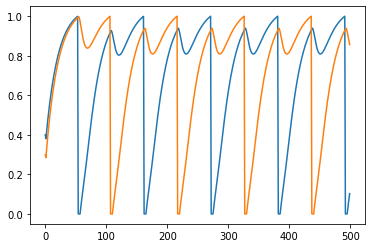

In [ ]:
i_ext = 1.05
N = 500
w_cross = -0.5
w_self = -0.5
outputs = run_simulation(w_cross, w_self, i_ext, synaptic_waveform,N, v_initial=np.array([0.4, 0.3]).reshape((2,1)))
v, s = outputs["voltage"], outputs["spike"]
plt.plot(v[:,0])
plt.plot(v[:,1])

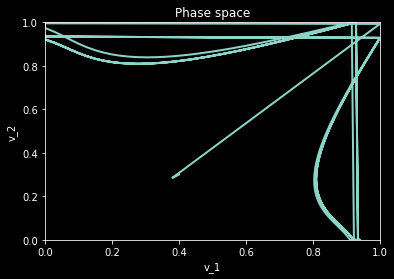

In [ ]:
phase_space_anim(v[:,0], v[:,1])

Observe the effect of self and cross coupling

Text(0.5, 1.0, 'v(t) for i=1.5, w_cross=-0.9, w_self=-0.2')

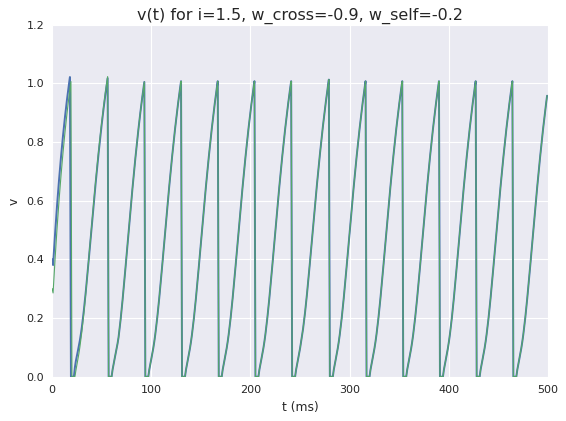

In [ ]:
i_ext = 1.5
N = 500
w_cross = -0.9
w_self = -0.2
outputs = run_simulation(w_cross, w_self, i_ext, synaptic_waveform,N, v_initial=np.array([0.4, 0.3]).reshape((2,1)))
v, s = outputs["voltage"], outputs["spike"]

plt.plot(v[:,0])
plt.style.use('classic')
plt.plot(v[:,1])
plt.xlabel("t (ms)")
plt.ylabel("v")
plt.title(f"v(t) for i={i_ext}, w_cross={w_cross}, w_self={w_self}")

In [ ]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']
